<a href="https://colab.research.google.com/github/sangadjievalina/EDA/blob/main/EDA_and_data_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install plotly --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 37.7 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.15.0
    Uninstalling plotly-5.15.0:
      Successfully uninstalled plotly-5.15.0


Библиотека Plotly плохо взаимодействует с colab, поэтому нужно немного донастроить ее на эту среду

In [ ]:
import plotly.io as pio

pio.renderers.default = 'colab'

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
import seaborn as sns
import datetime as dt
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',None)
init_notebook_mode(connected=True)

# Data Analysis

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df=pd.read_csv('/content/drive/My Drive/Data_Visualization/dataset.csv')
df.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


Теперь почистим данныем удали при необходимости пустые значения и дупликаты

In [ ]:
df = df.drop('Unnamed: 0', axis=1)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          114000 non-null  object 
 1   artists           113999 non-null  object 
 2   album_name        113999 non-null  object 
 3   track_name        113999 non-null  object 
 4   popularity        114000 non-null  int64  
 5   duration_ms       114000 non-null  int64  
 6   explicit          114000 non-null  bool   
 7   danceability      114000 non-null  float64
 8   energy            114000 non-null  float64
 9   key               114000 non-null  int64  
 10  loudness          114000 non-null  float64
 11  mode              114000 non-null  int64  
 12  speechiness       114000 non-null  float64
 13  acousticness      114000 non-null  float64
 14  instrumentalness  114000 non-null  float64
 15  liveness          114000 non-null  float64
 16  valence           11

In [ ]:
df.isnull().sum()

track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [ ]:
df = df[df['artists'].notna()]
df = df[df['album_name'].notna()]
df = df[df['track_name'].notna()]

In [ ]:
df.isnull().sum()

track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [ ]:
df.duplicated().value_counts()

False    113549
True        450
Name: count, dtype: int64

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.shape

(113549, 20)

In [ ]:
df.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,113549.000000,1.135490e+05,113549.000000,113549.000000,113549.000000,113549.000000,113549.000000,113549.000000,113549.000000,113549.000000,113549.000000,113549.000000,113549.000000,113549.000000
mean,33.324433,2.280814e+05,0.567031,0.642091,5.309452,-8.243408,0.637866,0.084674,0.314064,0.155703,0.213613,0.474205,122.175745,3.904218
std,22.283855,1.064131e+05,0.173409,0.251053,3.560147,5.011422,0.480620,0.105762,0.331906,0.309217,0.190462,0.259204,29.972954,0.432117
min,0.000000,8.586000e+03,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.741840e+05,0.456000,0.473000,2.000000,-9.998000,0.000000,0.035900,0.016800,0.000000,0.098000,0.260000,99.296000,4.000000
50%,35.000000,2.130000e+05,0.580000,0.685000,5.000000,-6.997000,1.000000,0.048900,0.168000,0.000041,0.132000,0.464000,122.020000,4.000000
75%,50.000000,2.615880e+05,0.695000,0.854000,8.000000,-5.001000,1.000000,0.084500,0.596000,0.048700,0.273000,0.683000,140.074000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


Создадим датафрейм cdf для работы с корреляционной матрицей - для столбцов с типом данных object или category, он преобразует этот

In [ ]:
cdf = df.copy()
for col in cdf.select_dtypes(include=['object', 'category']).columns:
    cdf[col] = cdf[col].astype('category').cat.codes
fig=px.imshow(cdf.corr(),text_auto=True,height=1200,color_continuous_scale=px.colors.sequential.Blues,aspect='auto',title='<b>pairwise correlation of columns')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
top = df.drop('track_genre', axis=1)
top.drop_duplicates(inplace=True)
top.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4


In [ ]:
fig=make_subplots(rows=3,cols=2,subplot_titles=('<i>popularity', '<i>duration_ms', '<i>danceability', '<i>energy', '<i>loudness', '<i>speechiness', '<i>acousticness', '<i>instrumentalness', '<i>liveness', '<i>valence', '<i>tempo' '<i>track_genre'))
fig.add_trace(go.Histogram(x=top['popularity'],name='popularity'),row=1,col=1)
fig.add_trace(go.Histogram(x=top['duration_ms'],name='duration_ms'),row=1,col=2)
fig.add_trace(go.Histogram(x=top['danceability'],name='danceability'),row=2,col=1)
fig.add_trace(go.Histogram(x=top['energy'],name='energy'),row=2,col=2)
fig.add_trace(go.Histogram(x=top['loudness'],name='loudness'),row=3,col=1)
fig.add_trace(go.Histogram(x=top['speechiness'],name='speechiness'),row=3,col=2)
fig.update_layout(title_text='<b>Feature Distribution')
fig.update_layout(template='plotly_dark',title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig=make_subplots(rows=3,cols=2,subplot_titles=('<i>acousticness', '<i>instrumentalness', '<i>liveness', '<i>valence', '<i>tempo'))
fig.add_trace(go.Histogram(x=df['acousticness'],name='acousticness'),row=1,col=1)
fig.add_trace(go.Histogram(x=df['instrumentalness'],name='instrumentalness'),row=1,col=2)
fig.add_trace(go.Histogram(x=df['liveness'],name='liveness'),row=2,col=1)
fig.add_trace(go.Histogram(x=df['valence'],name='valence'),row=2,col=2)
fig.add_trace(go.Histogram(x=df['tempo'],name='tempo'),row=3,col=1)
fig.update_layout(title_text='<b>Feature Distribution')
fig.update_layout(template='plotly_dark',title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig=px.histogram(df.groupby('track_genre',as_index=False).sum().sort_values(by='popularity',ascending=False),x='track_genre',y='popularity',color_discrete_sequence=['pink'],template='plotly_dark',marginal='box',title='<b>Popular genres based on popularity</b>')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig=px.histogram(df.groupby('track_genre',as_index=False).count().sort_values(by='track_name',ascending=False),
                 x='track_genre',
                 y='track_name',
                 color_discrete_sequence=['pink'],
                 template='plotly_dark',
                 marginal='box',
                 title='<b>Total songs based on genres</b>')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig = px.bar(top.groupby('artists',as_index=False).count().sort_values(by='track_name',ascending=False).head(50),
       x='artists',
       y='track_name',
       labels={'track_name':'Total Songs'},
       color_discrete_sequence=['lightblue'],
       text='track_name',
       title='<b> List of Songs Recorded by Each Singer')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig = px.bar(top.groupby('artists',as_index=False).sum().sort_values(by='popularity',ascending=False).head(30),
       x='artists',
       y='popularity',
       color_discrete_sequence=['#1DB954'],
       template='plotly_dark',
       text='popularity',
       title='<b>Top 30 Popular Singers')


In [ ]:
top_25 = top.nlargest(25, 'popularity')
fig=px.line(top_25,
            x='track_name',
            y='popularity',
            hover_data=['artists'],
            color_discrete_sequence=['pink'],
            markers=True,
            title='<b> Top 10 songs in Spotify')
fig.show(renderer='colab')

In [ ]:
artist_popularity = df.groupby('artists')['popularity'].sum().reset_index()
threshold = 430
popular_artists = artist_popularity[artist_popularity['popularity'] > threshold]
pdf = pd.merge(df, popular_artists, on='artists', how='inner')
pdf = pdf.drop('popularity_y', axis=1)
pdf.rename(columns = {'popularity_x':'popularity'}, inplace = True)
pdf.shape

(40229, 20)

In [ ]:
fig=px.treemap(pdf,path=[px.Constant('Artists'),'artists', 'track_genre', 'track_name'],
               values='popularity',
               title='<b>TreeMap of Artists Playlist')
fig.update_traces(root_color='lightgreen')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig=px.pie(top.groupby('explicit',as_index=False).count().sort_values(by='track_name',ascending=False),
           names='explicit',
           values='track_name',
           labels={'track_name':'Total songs'},
           hole=.6,
           color_discrete_sequence=['#237f52','#e32636'],
           template='plotly_dark',title='<b>Songs having explicit content')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig = px.box(top,
       x='explicit',
       y='popularity',
       color='explicit',
       template='plotly_dark',
       color_discrete_sequence=['cyan','magenta'],
       title='<b>popularity based on explicit content')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig = px.scatter(top.head(5700),
           x='danceability',
           y='popularity',
           color='danceability',
           color_continuous_scale=px.colors.sequential.Plasma,
           template='plotly_dark',
           title='<b>Danceability Versus Popularity')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig = px.scatter(top.head(5700),
           x='speechiness',
           y='popularity',
           color='speechiness',
           color_continuous_scale=px.colors.sequential.Plasma,
           template='plotly_dark',
           title='<b> Speechiness Versus Popularity')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig = px.scatter(top.head(5700),
           x='energy',
           y='danceability',
           color='danceability',
           color_continuous_scale=px.colors.sequential.Plotly3,
           template='plotly_dark',
           title='<b>Energy Versus Danceability')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

In [ ]:
fig = px.scatter(top,
           x='energy',
           y='loudness',
           color_discrete_sequence=['lightgreen'],
           template='plotly_dark',
           title='<b>Energy versus Loudness correlation')
fig.update_layout(title_x=0.5)
fig.show(renderer='colab')

[Text(0.5, 1.0, 'popularity vs accoustic corr')]

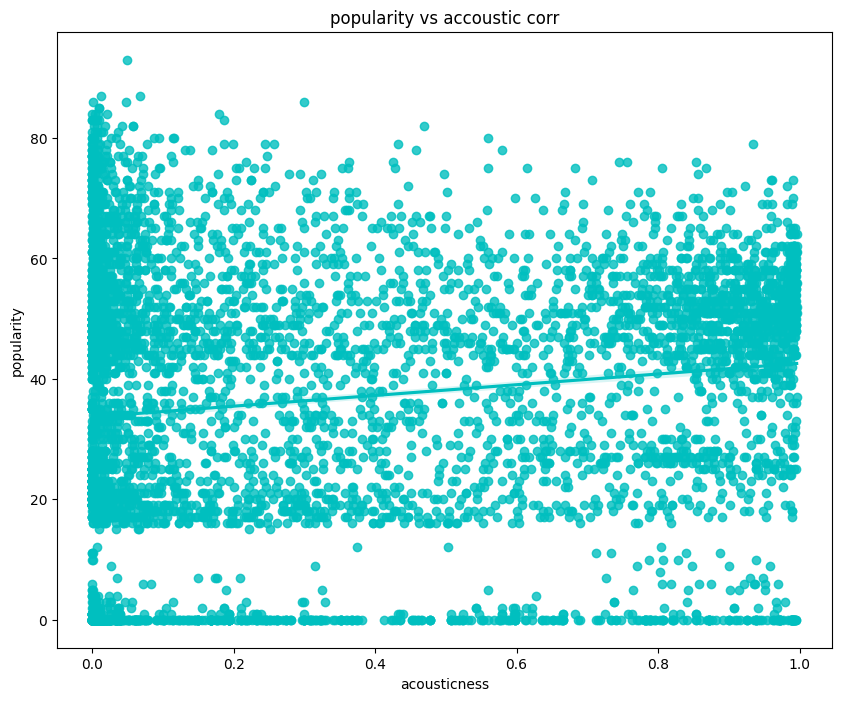

In [ ]:
plt.figure(figsize=(10,8))
sns.regplot(data=top.head(5700),y="popularity",x="acousticness",color="c").set(title="popularity vs accoustic corr")